In [1]:
import matplotlib.pyplot as plt
import math
import numpy as np
import pandas as pd
import seaborn as sns
import itertools
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objects as go
from sklearn import preprocessing
from sklearn import linear_model
from mlxtend.plotting import plot_decision_regions
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from statsmodels.tools.eval_measures import mse, rmse
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.tree import export_graphviz
from sklearn import neighbors
from sklearn import tree
from sklearn import ensemble
from sklearn.model_selection import cross_val_score
import graphviz
import pydotplus
from dtreeviz.trees import dtreeviz
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, fbeta_score, classification_report, 
mean_absolute_error, mean_squared_error, r2_score)
from sklearn.metrics import roc_curve, precision_recall_curve, roc_auc_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from yellowbrick.datasets.loaders import load_occupancy
%matplotlib inline

# pd.options.display.float_format = '{:.3f}'.format
pd.options.display.float_format = '{:,}'.format
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

import warnings
warnings.filterwarnings(action="ignore")

/Users/dean/anaconda3/lib/python3.6/site-packages/dask/dataframe/utils.py:14: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.

/Users/dean/anaconda3/lib/python3.6/site-packages/distributed/config.py:63: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.

/Users/dean/anaconda3/lib/python3.6/site-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/Users/dean/anaconda3/lib/python3.6/site-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported

In [2]:
raw_df = pd.read_csv('./loan_data_final.csv')
raw_df.dataframeName = 'loan_data_final.csv'

# Introduction

This project will analyze what factors are most important in securing a loan. The applicants are analyzed for certain criteria according to LendingClub.com's standards. Data available __[here](https://www.kaggle.com/kennykozak/loan-repayment-prediction?select=loan_data_final.csv)__.

In [3]:
raw_df.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.1,11.35040654,19.48,737,"5,639.958333",28854,52.1,0,0,0,0
1,1,all_other,0.1071,228.22,11.08214255,14.29,707,"2,760.0",33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.37349118,11.63,682,"4,710.0",3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.35040654,8.1,712,"2,699.958333",33667,73.2,1,0,0,0
4,1,all_other,0.1426,102.92,11.29973224,14.97,667,"4,066.0",4740,39.5,0,1,0,0


In [4]:
raw_df.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

<a id="section_ID"></a>

Here are what the columns represent:

* __credit.policy:__ 1 if the customer meets the credit underwriting criteria of LendingClub.com, and 0 otherwise.

* __purpose:__ The purpose of the loan (takes values "debtconsolidation", "educational", "smallbusiness", and "all_other").

* __int.rate:__ The interest rate of the loan, as a proportion (a rate of 11% would be stored as 0.11). Borrowers judged by LendingClub.com to be more risky are assigned higher interest rates.

* __installment:__ The monthly installments owed by the borrower if the loan is funded.

* __log.annual.inc:__ The natural log of the self-reported annual income of the borrower.

* __dti:__ The debt-to-income ratio of the borrower (amount of debt divided by annual income).

* __fico:__ The FICO credit score of the borrower.

* __days.with.cr.line:__ The number of days the borrower has had a credit line.

* __revol.bal:__ The borrower's revolving balance (amount unpaid at the end of the credit card billing cycle).

* __revol.util:__ The borrower's revolving line utilization rate (the amount of the credit line used relative to total credit available).

* __inq.last.6mths:__ The borrower's number of inquiries by creditors in the last 6 months.

* __delinq.2yrs:__ The number of times the borrower had been 30+ days past due on a payment in the past 2 years.

* __pub.rec:__ The borrower's number of derogatory public records (bankruptcy filings, tax liens, or judgments).

* __not.fully.paid:__ 1 if the borrower has finished paying the loan, 0 if they haven't.




In [5]:
raw_df['purpose'].unique()

array(['debt_consolidation', 'all_other', 'small_business', 'educational'],
      dtype=object)

In [6]:
raw_df['credit.policy'].unique()

#  1 if the customer meets the credit 
# underwriting criteria of LendingClub.com, and 0 otherwise

array([1, 0])

## Exploratory Findings

In [7]:
raw_df.shape

(9578, 14)

I decided I'm not going to look at interest rate or installment amounts, since those are determined after the loans are processed. Since they are past the process of approving the loans, I will only look at them after I build the models.

In [8]:
total_loans = raw_df['credit.policy'].sum()
print('Total loans meeting criteria (approved) : ' + str(total_loans))

Total loans meeting criteria (approved) : 7710


In [9]:
mean_df = pd.DataFrame(raw_df.groupby(['credit.policy'])['log.annual.inc', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util', 'inq.last.6mths', 'delinq.2yrs'].mean().round(2))

In [10]:
mean_df.reset_index(drop=False, inplace=True)

In [11]:
mean_df['log.annual.inc'] = np.exp(mean_df['log.annual.inc'])

In [12]:
mean_df = mean_df.rename(columns={"credit.policy": "Credit Policy",
                        "log.annual.inc": "Annual Income",
                        "fico": "FICO Score",
                       "days.with.cr.line": "Days with Credit", 
                       "revol.bal": "Revolving Balance ($)",
                       "revol.util": "Utilitization of Credit (%)",
                       "inq.last.6mths": "Credit Inquiries Last 6 Months",
                       "delinq.2yrs": "Late Payments"})

mean_df.loc[mean_df["Credit Policy"] == 0, ["Credit Policy"]] = "unapproved"
mean_df.loc[mean_df["Credit Policy"] == 1, ["Credit Policy"]] = "approved"
mean_df.round(2)

,Credit Policy,Annual Income,FICO Score,Days with Credit,Revolving Balance ($),Utilitization of Credit (%),Credit Inquiries Last 6 Months,Late Payments
0,unapproved,"53,637.3",683.98,"4,058.46","29,773.15",52.93,3.97,0.25
1,approved,"56,387.34",717.36,"4,682.47","13,798.4",45.31,1.0,0.14


Here we see the means of the features for each type of loan. The loans are split by type and by approval (0 is unapproved, 1 is approved).

Bear in mind that the interest rate and installment amount were assessed separately from the ultimate approval of the loan.

In [13]:
by_fico = raw_df.groupby(by=['fico']).agg({'count', 'sum'}).reset_index()
lower_15_fico = by_fico[['fico', 'credit.policy']].head(15)
lower_15_fico

fico credit.policy     
                count  sum
0   612             2    0
1   617             1    0
2   622             1    0
3   627             2    1
4   632             6    1
5   637             5    0
6   642           102    0
7   647           112    0
8   652           131    0
9   657           127    0
10  662           414  306
11  667           438  317
12  672           395  293
13  677           427  323
14  682           536  425

In [14]:
lower_15_fico.to_excel(r'/Users/dean/desktop/lower15fico.xlsx')

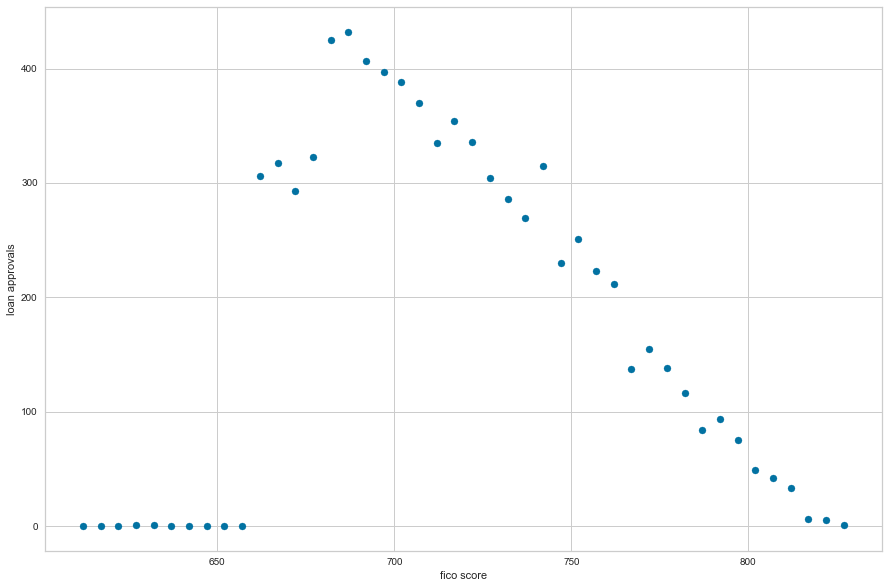

In [15]:
plt.figure(figsize=(15, 10))
plt.scatter(by_fico['fico'], by_fico['credit.policy']['sum'])
plt.xlabel('fico score')
plt.ylabel('loan approvals')
plt.show();

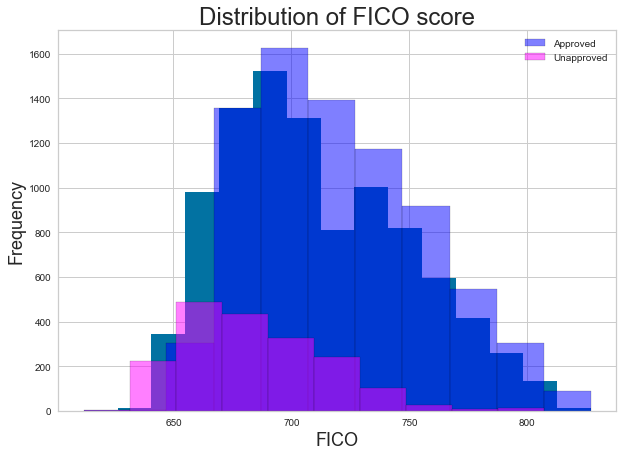

In [16]:
raw_df['fico'].hist(bins=15)

raw_df[raw_df['credit.policy'] == 1].fico.plot(kind='hist', color='blue', edgecolor='black', alpha=0.5, figsize=(10, 7))
raw_df[raw_df['credit.policy'] == 0].fico.plot(kind='hist', color='magenta', edgecolor='black', alpha=0.5, figsize=(10, 7))
plt.legend(labels=['Approved', 'Unapproved'])
plt.title('Distribution of FICO score', size=24)
plt.xlabel('FICO', size=18)
plt.ylabel('Frequency', size=18);

In [17]:
raw_df.columns

Index(['credit.policy', 'purpose', 'int.rate', 'installment', 'log.annual.inc',
       'dti', 'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'not.fully.paid'],
      dtype='object')

In [18]:
# Distribution graphs (histogram/bar graph) of column data
def plot_per_column_dist(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()


In [19]:
# Scatter and density plots
def plot_scatter_matrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

## Histograms

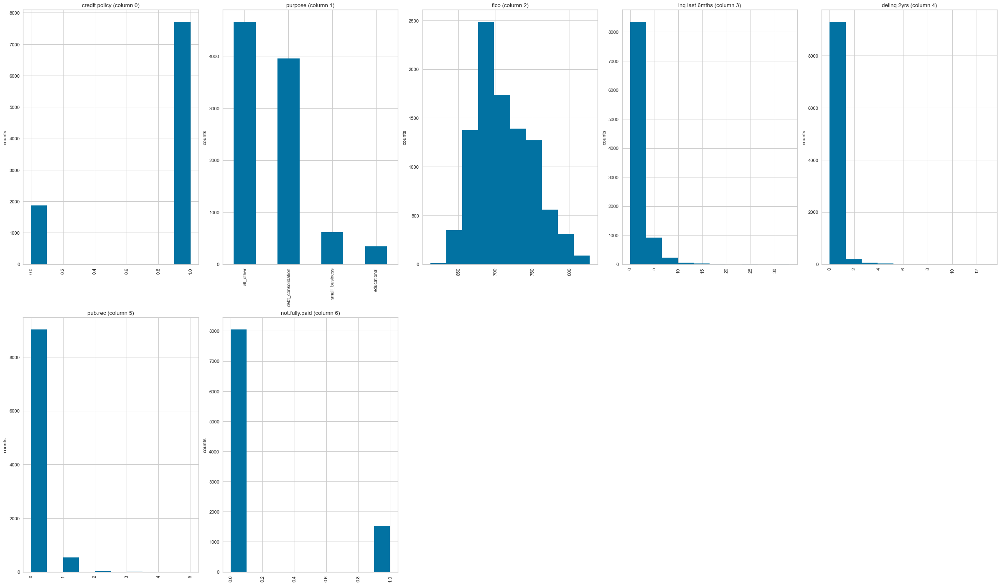

In [20]:
plot_per_column_dist(raw_df, 10, 5)

Here we see that the majority of applicants are applying for a personal loan ("other"), followed by debt consolodation.

We also see the highest median FICO scores to be between 650-695. This turns out to be an important feature in the bank's model.

## Correlation Chart

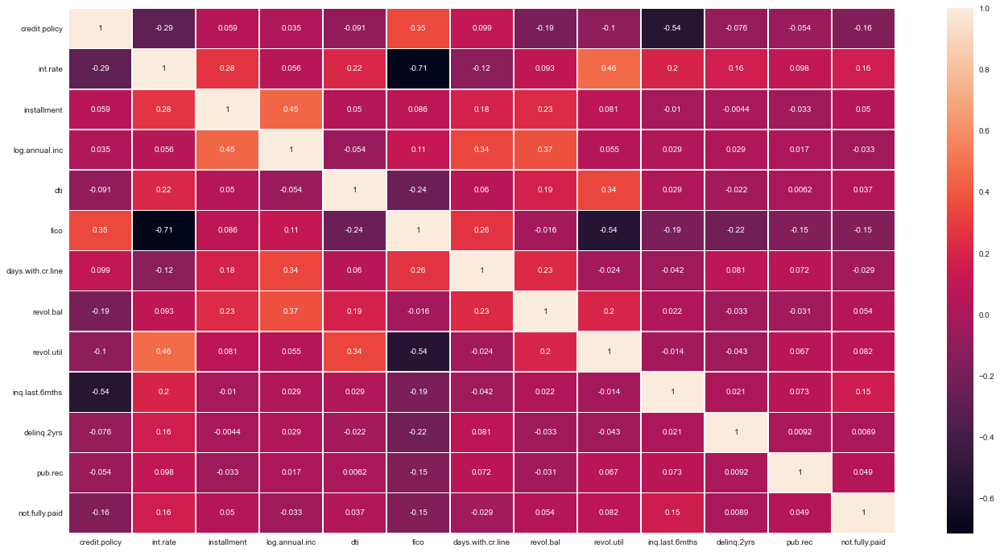

In [21]:
fig, ax = plt.subplots(figsize=(23,12))         # Sample figsize in inches
sns.heatmap(raw_df.corr(), 
            annot=True, linewidths=.5, ax=ax);

We see here that there is a strong negative correlation between:

* interest rate and FICO
* credit inquiry in the last six months and loan approval

There is a strong positive correlation between:

* utilization of revolving credit and the interest rate
* FICO score and loan approval


## Pairplots

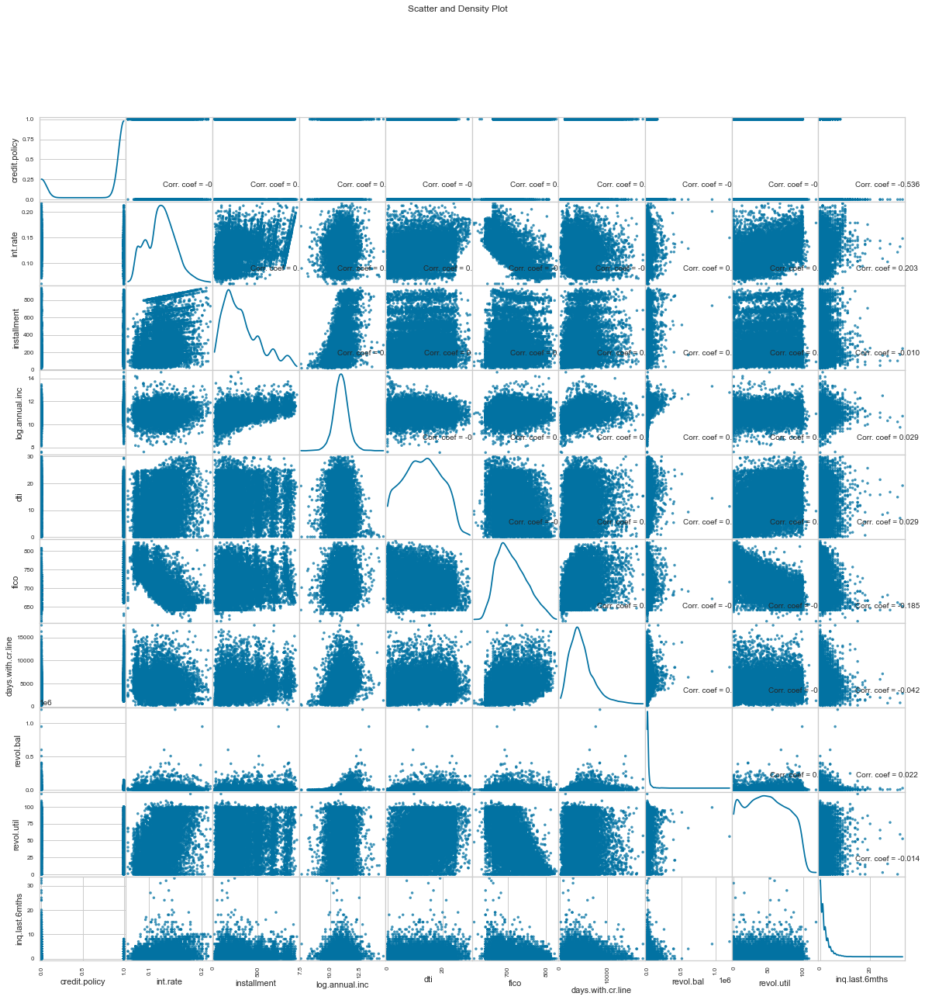

In [22]:
plot_scatter_matrix(raw_df, 20, 10)

Here we can see a bit of positive correlation between the FICO score and the interest rate. People with higher FICO scores often get approved for lower interest rates.

There is also some positive correlation between the income of the borrower and the installment payments. This could be attributed to people of higher income being able to pay off the loan in a shorter term, hence higher installments.

In [23]:
raw_df.shape

(9578, 14)

In [24]:
df = pd.get_dummies(raw_df, columns=['purpose'], drop_first=True)

In [25]:
df.tail()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_debt_consolidation,purpose_educational,purpose_small_business
9573,0,0.1461,344.76,12.18075484,10.39,672,"10,474.0",215372,82.1,2,0,0,1,0,0,0
9574,0,0.1253,257.7,11.14186178,0.21,722,"4,380.0",184,1.1,5,0,0,1,0,0,0
9575,0,0.1071,97.81,10.59663473,13.09,687,"3,450.041667",10036,82.9,8,0,0,1,1,0,0
9576,0,0.16,351.58,10.81977828,19.18,692,"1,800.0",0,3.2,5,0,0,1,0,0,0
9577,0,0.1392,853.43,11.26446411,16.28,732,"4,740.0",37879,57.0,6,0,0,1,1,0,0


In [26]:
df.shape

(9578, 16)

## Feature Selection

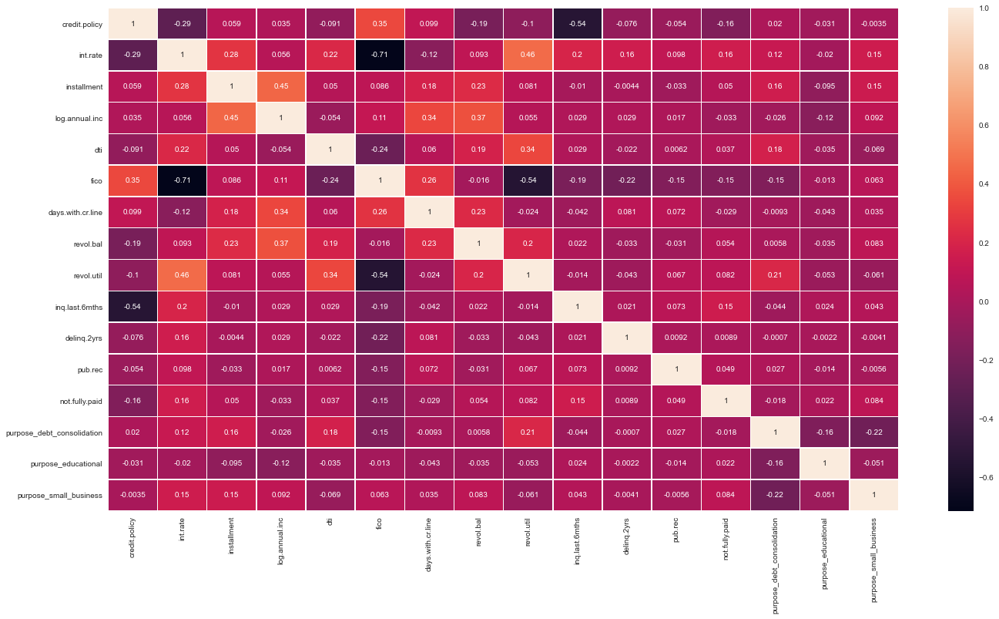

In [27]:
fig, ax = plt.subplots(figsize=(23,12))         # Sample figsize in inches
sns.heatmap(df.corr(), 
            annot=True, linewidths=.5, ax=ax);

In [28]:
y = df['credit.policy']

In [29]:
func = lambda x: (100*x.count()/df.shape[0]).round(2)

table = pd.pivot_table(raw_df, values=['int.rate'], index=['credit.policy'],
                    aggfunc=func)

table.reset_index(drop=False, inplace=True)

table.rename(columns = {'int.rate':'percentage'}, inplace = True)

In [30]:
table

,credit.policy,percentage
0,0,19.5
1,1,80.5


* 19.5% unapproved
* 80.5% approved

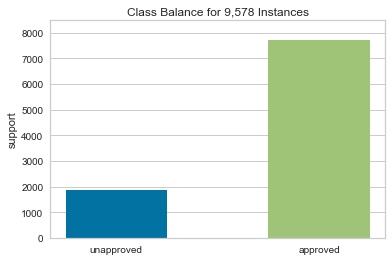

In [31]:
from yellowbrick.target import ClassBalance


visualizer = ClassBalance(labels=["unapproved", "approved"])

visualizer.fit(y)        # Fit the data to the visualizer
visualizer.show();       # Finalize and render the figure

The class balance is split sufficiently to get good results on both. We can see that a model may misclassify the outcome more often as "approved" than "unapproved," based on occurrence.

In [32]:
df['fico_cross_revol'] = df['fico'] * df['revol.util']

In [33]:
corr_table = pd.DataFrame(df.corr('pearson'))
corr_table[corr_table.columns[0:1]]

,credit.policy
credit.policy,1.0
int.rate,-0.29408908922610894
installment,0.0587696163132133
log.annual.inc,0.03490601145177519
dti,-0.09090056913279855
fico,0.348318683119132
days.with.cr.line,0.09902619294941879
revol.bal,-0.18751847900734364
revol.util,-0.10409494555109125
inq.last.6mths,-0.5355111793311784


In [34]:
features = ['fico', 'fico_cross_revol', 'inq.last.6mths', 'days.with.cr.line', 'dti', 'log.annual.inc', 'revol.bal', 
            'delinq.2yrs', 'pub.rec', 'not.fully.paid', 'purpose_debt_consolidation',
            'purpose_educational', 'purpose_small_business']

I am removing interest rate because of the high degree of multicollinearity between interest rate and FICO. The FICO and revolving credit utility also have a high correlation, so I took the revolving credit utility out as well. This feature selection should result in output that is not confused by these variables interacting with each other.

In [35]:
X = df[features]

In [36]:
X.describe()

,fico,fico_cross_revol,inq.last.6mths,days.with.cr.line,dti,log.annual.inc,revol.bal,delinq.2yrs,pub.rec,not.fully.paid,purpose_debt_consolidation,purpose_educational,purpose_small_business
count,"9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0","9,578.0"
mean,710.8463144706619,"32,670.79184172048",1.5774692002505741,"4,560.7671965292075",12.606678847358546,10.932117137800155,"16,913.963875548132",0.1637084986427229,0.06212152850281896,0.16005429108373356,0.4131342660263103,0.03581123407809564,0.06462727082898309
std,37.97053722671439,"19,801.10225256178",2.2002453149372516,"2,496.9303768113477",6.883969540539585,0.6148127513545946,"33,756.18955725055",0.5462149246211797,0.2621263263742703,0.3666755411343309,0.492422238100335,0.1858289401000857,0.24587984617071632
min,612.0,0.0,0.0,178.95833330000002,0.0,7.547501682999999,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,682.0,"16,317.2",0.0,"2,820.0",7.2124999999999995,10.55841352,"3,187.0",0.0,0.0,0.0,0.0,0.0,0.0
50%,707.0,"32,697.15",1.0,"4,139.958333",12.665,10.92888357,"8,596.0",0.0,0.0,0.0,0.0,0.0,0.0
75%,737.0,"49,104.0",2.0,"5,730.0",17.95,11.291292917500002,"18,249.5",0.0,0.0,0.0,1.0,0.0,0.0
max,827.0,"77,627.2",33.0,"17,639.95833",29.96,14.52835448,"1,207,359.0",13.0,5.0,1.0,1.0,1.0,1.0


In [37]:
X.shape

(9578, 13)

In [38]:
X.head()

,fico,fico_cross_revol,inq.last.6mths,days.with.cr.line,dti,log.annual.inc,revol.bal,delinq.2yrs,pub.rec,not.fully.paid,purpose_debt_consolidation,purpose_educational,purpose_small_business
0,737,"38,397.700000000004",0,"5,639.958333",19.48,11.35040654,28854,0,0,0,1,0,0
1,707,"54,226.9",0,"2,760.0",14.29,11.08214255,33623,0,0,0,0,0,0
2,682,"17,459.2",1,"4,710.0",11.63,10.37349118,3511,0,0,0,1,0,0
3,712,"52,118.4",1,"2,699.958333",8.1,11.35040654,33667,0,0,0,1,0,0
4,667,"26,346.5",0,"4,066.0",14.97,11.29973224,4740,1,0,0,0,0,0


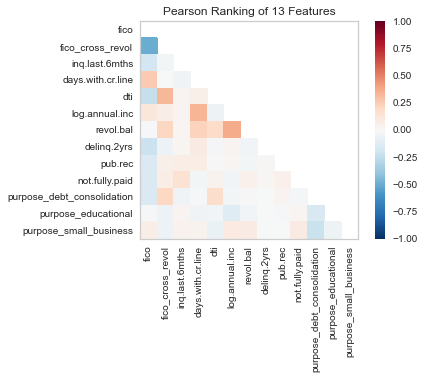

In [39]:
from yellowbrick.features import Rank2D

visualizer = Rank2D(algorithm='pearson')
visualizer.fit(X, y)           
visualizer.transform(X)        
visualizer.show();

A two-dimensional ranking of features utilizes a ranking algorithm that takes into account pairs of features at a time. We use Pearson correlation to score to detect colinear relationships.

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print("The number of observations in training set is {}".format(X_train.shape[0]))
print("The number of observations in test set is {}".format(X_test.shape[0]))

The number of observations in training set is 7662
The number of observations in test set is 1916


Because the revolving balance is in a dollar amount which is on average quite high, I will normalize that variable.

## Scaling Variables

I am scaling the variables that have a high range between values and may make the model more computationally expensive. 

In [41]:
train_norm = X_train[['fico_cross_revol', 'revol.bal', 'days.with.cr.line']]
test_norm = X_test[['fico_cross_revol', 'revol.bal', 'days.with.cr.line']]
std_scale = preprocessing.StandardScaler().fit(train_norm)
x_train_norm = std_scale.transform(train_norm)
training_norm_col = pd.DataFrame(x_train_norm, index=train_norm.index, columns=train_norm.columns) 
X_train.update(training_norm_col)
X_train.head()

,fico,fico_cross_revol,inq.last.6mths,days.with.cr.line,dti,log.annual.inc,revol.bal,delinq.2yrs,pub.rec,not.fully.paid,purpose_debt_consolidation,purpose_educational,purpose_small_business
7317,692,-0.6311698116837078,1,0.26863584611903196,11.41,9.994241916,-0.5201987939813125,0,0,0,0,0,0
350,742,-0.12399685649434296,0,-0.566437709684115,6.06,11.22524339,-0.3888020168154133,0,0,0,0,0,0
5206,717,0.9723522453909882,1,-0.302347362614244,6.83,11.17043516,-0.14491538647948057,0,0,0,1,0,0
2673,732,1.5109988785762696,0,-0.1944836951228564,8.35,11.05885818,0.8050940982590962,0,0,1,0,0,0
3528,757,-1.4575974204178554,1,0.9921997789131941,19.04,10.6933984,-0.514107972828282,0,0,0,0,0,0


In [42]:
std_scale = preprocessing.StandardScaler().fit(test_norm)
x_test_norm = std_scale.transform(test_norm)
testing_norm_col = pd.DataFrame(x_test_norm, index=test_norm.index, columns=test_norm.columns) 
X_test.update(testing_norm_col)
X_test.head()

,fico,fico_cross_revol,inq.last.6mths,days.with.cr.line,dti,log.annual.inc,revol.bal,delinq.2yrs,pub.rec,not.fully.paid,purpose_debt_consolidation,purpose_educational,purpose_small_business
8558,657,1.0331253453056237,3,-0.2940252407235811,14.52,10.59663473,-0.2377056274828435,0,0,0,1,0,0
4629,732,-0.18661578167635215,3,-0.3789552117758706,10.89,11.15625052,-0.05930312510893299,0,0,0,1,0,0
1383,692,1.305195945966483,0,-0.997747566476379,13.73,10.34817337,-0.10242650948699869,0,0,1,0,0,0
8142,672,-0.8252685988306352,4,0.7858155282607847,28.16,11.00209984,-0.2545642660064833,1,0,0,0,0,0
1768,702,-1.447804570299185,1,0.20342173258268598,3.99,11.12732181,-0.43250852212581703,1,0,0,0,0,0


# Classifier Models

## Dummy (Baseline) Classifier - Loan Acceptance

Here we will run a model to determine "baseline" performance. This classifier will simply guess where the loans are to be classified--could be 0 or 1 depending on the randomly chosen (most frequent) number.

In [43]:
from sklearn.dummy import DummyClassifier
clf = DummyClassifier(random_state=42, strategy='stratified')
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)
confusion = confusion_matrix(y_test,y_pred)

In [44]:
list(clf.get_params().items())

[('constant', None), ('random_state', 42), ('strategy', 'stratified')]

In [45]:
print('y actual : \n' +  str(y_test.value_counts()))

y actual : 
1    1544
0     372
Name: credit.policy, dtype: int64


In [46]:
#Distribution of y predicted
print('y predicted : \n' + str(pd.Series(y_pred).value_counts()))

y predicted : 
1    1535
0     381
dtype: int64


In [47]:
# Model Evaluation metrics 
print('F1 Score : ' + str(f1_score(y_test,y_pred)))

#Dummy Classifier Confusion matrix
print('Confusion Matrix : \n' + str(confusion))

F1 Score : 0.7983111399805132
Confusion Matrix : 
[[  66  306]
 [ 315 1229]]


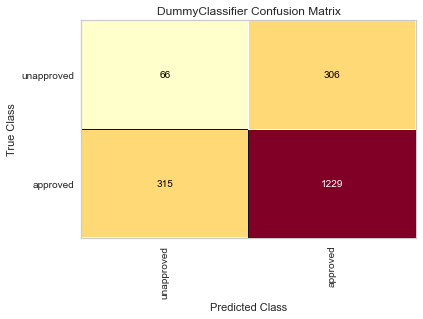

In [48]:
from yellowbrick.classifier import ConfusionMatrix

cm = ConfusionMatrix(clf, classes=['unapproved', 'approved'])

cm.fit(X_train, y_train)

cm.score(X_test, y_test)

cm.show();

In [137]:
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

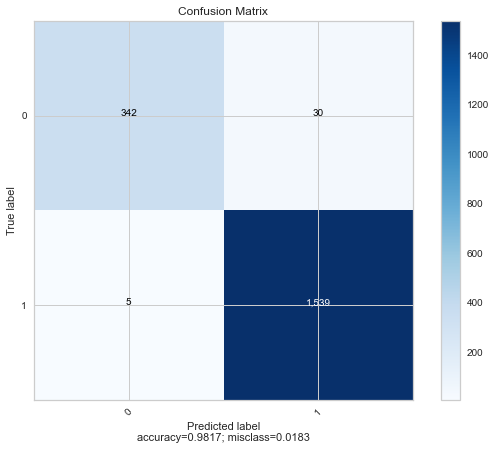

In [138]:
plot_confusion_matrix(cm=confusion, target_names = [0, 1], title = 'Confusion Matrix',normalize=False)

Precision is a value that tells us what proportion of positive predictions are correct. That is, if the model has a precision of 0.5 then 50% of its positive predictions are correct. Let's calculate the precision of our model. Here we can see that a true positive, meaning the approved loan that was _actually approved_, was predicted 1544 times. This will be divided by the same number, plus the false positives, or those that are _actually not approved_ predicted as approved. This yields a score of 81%.

The recall is 79% because we are looking at true positives (1,229) divided by the same number and false negatives.

On closer inspection we notice that _actually negative_ values are misidentified as positive 82% of the time. The dummy model will predict loans much more often as approved. Even though the overall accuracy is 67%, it is not very trustworthy.

In [57]:
print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred)))
print('Precision Score : ' + str(precision_score(y_test,y_pred)))
print('Recall Score : ' + str(recall_score(y_test,y_pred)))

Accuracy Score : 0.6758872651356994
Precision Score : 0.8006514657980456
Recall Score : 0.7959844559585493


In [60]:
report = classification_report(y_test, y_pred, target_names =['unapproved', 'approved'], labels = [0, 1])
print(report)

              precision    recall  f1-score   support

  unapproved       0.17      0.18      0.18       372
    approved       0.80      0.80      0.80      1544

    accuracy                           0.68      1916
   macro avg       0.49      0.49      0.49      1916
weighted avg       0.68      0.68      0.68      1916



In [64]:
probs = clf.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, probs)

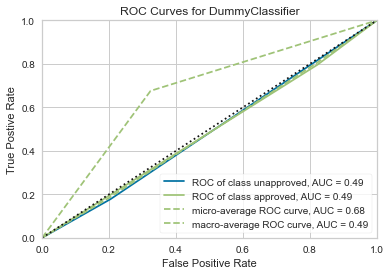

In [65]:
from yellowbrick.classifier import ROCAUC

visualizer = ROCAUC(clf, classes=['unapproved', 'approved'])
visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)
visualizer.show();

In [66]:
auc = roc_auc_score(y_test, probs)
print('Area under the ROC curve: {:.3f}'.format(auc))

Area under the ROC curve: 0.487


## Logistic Regression

In [67]:
lr = LogisticRegression(solver='lbfgs', max_iter=10000, random_state=2)
lr.fit(X_train, y_train)

test_score = lr.score(X_test, y_test)
train_score = lr.score(X_train, y_train)

print('Accuracy on training data: ', train_score)
print('Accuracy on test data: ', test_score)

Accuracy on training data:  0.9030279300443749
Accuracy on test data:  0.8977035490605428


This is the accuracy score of the logistic regression model, which categorizes loans that meet the lender's criteria from those that do not. We could try increasing the iterations here, but it ends up not making a difference in the score. Additionally, we could try l2 regularization for extreme values, but that does not seem to help with this model either. The coefficients remain the same.

The score is higher on the test data, which could be because it is a smaller sample.

The penalty does not change the score here.

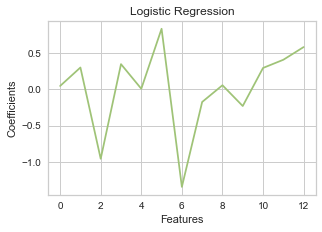

In [68]:
fig = plt.figure(figsize=(12, 8))
grid = plt.GridSpec(2, 2, hspace=0.5, wspace=0.5)

x = np.arange(0, len(lr.coef_[0]),1)
y = lr.coef_[0]
ax1 = fig.add_subplot(grid[0, 0])
ax1.plot(x, y, '-g')
ax1.set(xlabel='Features', ylabel='Coefficients')
ax1.set_title('Logistic Regression')
plt.show()

In [69]:
predictions = lr.predict(X_test)

confusion = confusion_matrix(y_test, predictions, labels=[0, 1])
print(confusion)

[[ 230  142]
 [  54 1490]]


In [72]:
report = classification_report(y_test, predictions, target_names =['unapproved', 'approved'], labels = [0, 1], output_dict=True)
report_df = pd.DataFrame(report).transpose().round(2)
report_df

,precision,recall,f1-score,support
unapproved,0.81,0.62,0.7,372.0
approved,0.91,0.97,0.94,"1,544.0"
accuracy,0.9,0.9,0.9,0.9
macro avg,0.86,0.79,0.82,"1,916.0"
weighted avg,0.89,0.9,0.89,"1,916.0"


In [73]:
report_df.to_excel(r'/Users/dean/desktop/logistic.xlsx')

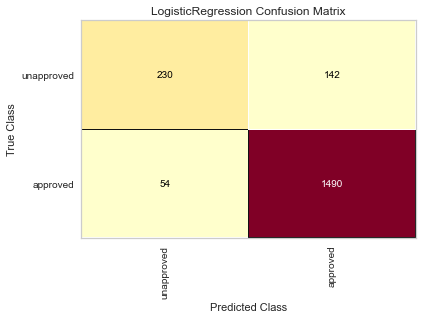

In [74]:
from yellowbrick.classifier import ConfusionMatrix

cm = ConfusionMatrix(lr, classes=['unapproved', 'approved'])
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

This model has a higher recall score than precision. It skews more heavily to predict negative values (not approved) than positive (approved). 

In [75]:
precision = precision_score(y_test, predictions)
print('Precision score: {:.2f}'.format(precision))

Precision score: 0.91


In [76]:
recall = recall_score(y_test, predictions)
print('Recall score: {:.2f}'.format(recall))

Recall score: 0.97


In [77]:
f1 = f1_score(y_test, predictions)
fbeta_precision = fbeta_score(y_test, predictions, 0.5)
fbeta_recall = fbeta_score(y_test, predictions, 2)

print('F1 score: {:.2f}'.format(f1))
print('F-Beta score favoring precision: {:.2f}'.format(fbeta_precision))
print('F-Beta score favoring recall: {:.2f}'.format(fbeta_recall))

F1 score: 0.94
F-Beta score favoring precision: 0.92
F-Beta score favoring recall: 0.95


When evaluating classifiers, it is convenient to combine the precision and recall into a single value called the F1 score. We use the F-score to see how the two metrics level out when combined. If we care more about recall than precision, we would use the F-Beta score that favors recall. All scores look to be high here, so we aren't getting a great picture of the overall efficacy of the model.

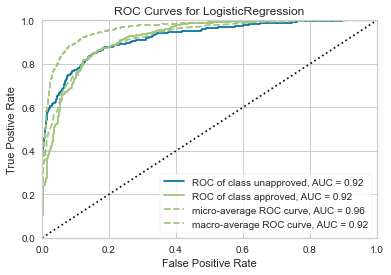

In [78]:
probs = lr.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, probs)

visualizer = ROCAUC(lr, classes=['unapproved', 'approved'])
visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)
visualizer.show();

In [79]:
auc = roc_auc_score(y_test, probs)
print('Area under the ROC curve: {:.3f}'.format(auc))

Area under the ROC curve: 0.921


Let's take a look at the ROC curve. The top left-hand corner of this graph is the ideal spot: it minimizes the false positive rate and maximizes the true positive rate. So a steep curve that gets close to that corner is better than a shallow curve that remains close to the dashed baseline. That dashed line represents a 50% random chance classifier. That is, any classifier that works as well as a coin toss will have a curve close to that line. But that is as good as random. So curves just above that line are better than random. 

The particular curve for this classifier is not great as you can see it rounds out before leveling out. This turns out to be the best metric for this type of model. If we were to shade in the area under this curve it would cover 88.2% of all predictions correctly.

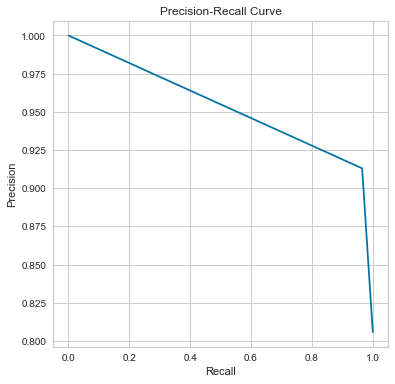

In [80]:
pres, rec, thresholds = precision_recall_curve(y_test, predictions)
fig = plt.figure(figsize = (6, 6))
plt.plot(rec, pres)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

There is a steep tradeoff between precision and recall. While recall rises, precision falls sharply. The angle of this curve is not the ideal 90 degrees.

### Logistic Regression Tuning

In [81]:
lr = LogisticRegression()
grid_values = {'penalty': ['l1', 'l2', 'elasticnet', 'none'],
               'C':[0.001,.009,0.01,.09,1,5,10,25,50,100], 
               'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag']}
grid_lr_acc = GridSearchCV(lr, param_grid = grid_values, scoring = 'recall')
grid_lr_acc.fit(X_train, y_train)

# try scoring='recall' or 'accuracy'
#Predict values based on new parameters
y_pred_acc = grid_lr_acc.predict(X_test)
probs = grid_lr_acc.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, probs)

# New Model Evaluation metrics

print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred_acc)))
print('Precision Score : ' + str(precision_score(y_test,y_pred_acc)))
print('Recall Score : ' + str(recall_score(y_test,y_pred_acc)))
print('F1 Score : ' + str(f1_score(y_test,y_pred_acc)))
print('Area under the ROC curve: {:.3f}'.format(roc_auc_score(y_test, probs)))

#Logistic Regression (Grid Search) Confusion matrix
confusion = confusion_matrix(y_test,y_pred_acc)

Accuracy Score : 0.8549060542797495
Precision Score : 0.8508869179600886
Recall Score : 0.9941709844559585
F1 Score : 0.9169653524492234
Area under the ROC curve: 0.834


In [82]:
for param, v in grid_lr_acc.best_params_.items():
    print({param: v})
    
print('Best Accuracy Score : ' + str(grid_lr_acc.best_score_))

{'C': 0.001}
{'penalty': 'l1'}
{'solver': 'liblinear'}
Best Accuracy Score : 0.9959452443014296


When we get the best parameters for logistic regression, we see an increase in the area under the ROC curve of 0.042. This resets the parameters using a solver of 'newton-cg' instead of the previous 'lbfgs.' The 'C' parameter is kept its default of 1. The penalty was set to 'l2'.

This is a significant increase, and one that will help us determine which loans get approved and which do not. Let's break this down with a classification report:

In [84]:
report = classification_report(y_test, y_pred_acc, target_names =['unapproved', 'approved'], labels = [0, 1], output_dict=True)
report_df = pd.DataFrame(report).transpose().round(2)
report_df

,precision,recall,f1-score,support
unapproved,0.92,0.28,0.43,372.0
approved,0.85,0.99,0.92,"1,544.0"
accuracy,0.85,0.85,0.85,0.85
macro avg,0.89,0.64,0.67,"1,916.0"
weighted avg,0.86,0.85,0.82,"1,916.0"


In [85]:
report_df.to_excel(r'/Users/dean/desktop/gridsearch-logistic.xlsx')

In [1138]:
lr.get_params().keys()

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])

In [1139]:
print('y actual : \n' +  str(y_test.value_counts()))

y actual : 
1    1544
0     372
Name: credit.policy, dtype: int64


In [1140]:
#Distribution of y predicted
print('y predicted : \n' + str(pd.Series(y_pred_acc).value_counts()))

y predicted : 
1    1632
0     284
dtype: int64


In [86]:
# Model Evaluation metrics 
print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred_acc)))
print('F1 Score : ' + str(f1_score(y_test,y_pred_acc)))
print('Confusion Matrix : \n' + str(confusion))

Accuracy Score : 0.8549060542797495
F1 Score : 0.9169653524492234
Confusion Matrix : 
[[ 103  269]
 [   9 1535]]


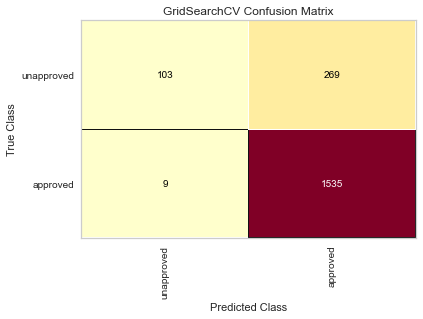

In [139]:
cm = ConfusionMatrix(grid_lr_acc, classes=['unapproved', 'approved'])
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

## Decision Tree Classifier

In [131]:
from sklearn.tree import DecisionTreeClassifier

# Define model. Specify a number for random_state to ensure same results each run
loan_clf = DecisionTreeClassifier(criterion="gini", max_depth=9, random_state=42)

# Fit model
loan_clf.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=9, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

I chose the max_depth of 9 here because, without setting the max_depth, it created a tree with 16 nodes. This would be an overfit model looking at data too granularly to be applicable to new datasets. There was no significant decrease on accuracy at a depth of 9 vs a depth of 10 or above. 

In [132]:
test_score = loan_clf.score(X_test, y_test)
train_score = loan_clf.score(X_train, y_train)

print('Score on training data: ', train_score)
print('Score on test data: ', test_score)

Score on training data:  0.9962150874445315
Score on test data:  0.9822546972860126


## Tree visualizations

In [90]:
# fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=700)
# tree.plot_tree(loan_clf,
#                feature_names = features,
#                filled = True);

# fig.savefig('loan_model_tree.png')

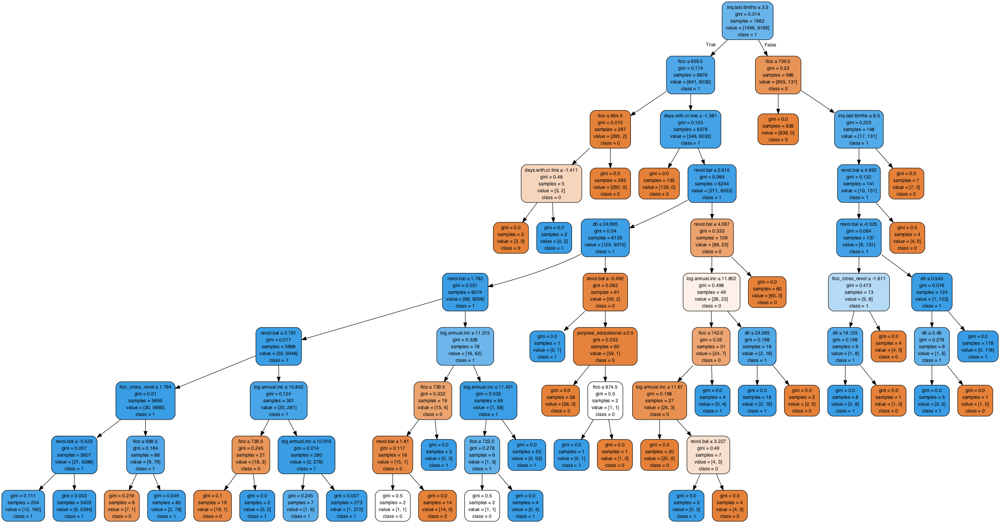

In [91]:
# tree.export_graphviz(loan_clf,
#                      out_file="tree.dot",
#                      feature_names = features,
#                      filled = True)

dot_data = StringIO()
export_graphviz(loan_clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns ,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [92]:
predictions = loan_clf.predict(X_test)

confusion = confusion_matrix(y_test, predictions, labels=[0, 1])
print(confusion)

[[ 343   29]
 [   5 1539]]


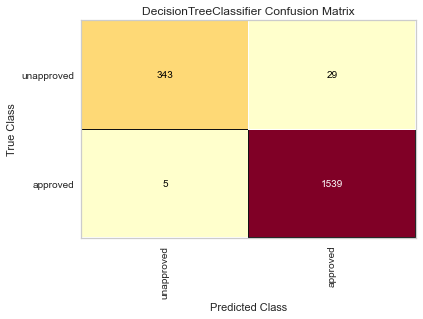

In [140]:
cm = ConfusionMatrix(loan_clf, classes=['unapproved', 'approved'])
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

This model has effective recall and precision for approved loans, but it predicts approvals much more accurately than it predicts negatives.

In [143]:
report = classification_report(y_test, predictions, target_names =['unapproved', 'approved'], labels = [0, 1], output_dict=True)
report_df = pd.DataFrame(report).transpose().round(2)
report_df

,precision,recall,f1-score,support
unapproved,0.99,0.92,0.95,372.0
approved,0.98,1.0,0.99,"1,544.0"
accuracy,0.98,0.98,0.98,0.98
macro avg,0.98,0.96,0.97,"1,916.0"
weighted avg,0.98,0.98,0.98,"1,916.0"


In [144]:
report_df.to_excel(r'/Users/dean/desktop/decision-tree.xlsx')

In [97]:
precision = precision_score(y_test, predictions)
print('Precision score: {:.2f}'.format(precision))

Precision score: 0.98


In [98]:
recall = recall_score(y_test, predictions)
print('Recall score: {:.2f}'.format(recall))

Recall score: 1.00


In [99]:
f1 = f1_score(y_test, predictions)
fbeta_precision = fbeta_score(y_test, predictions, 0.5)
fbeta_recall = fbeta_score(y_test, predictions, 2)

print('F1 score: {:.2f}'.format(f1))
print('Fbeta score favoring precision: {:.2f}'.format(fbeta_precision))
print('FBeta score favoring recall: {:.2f}'.format(fbeta_recall))

F1 score: 0.99
Fbeta score favoring precision: 0.98
FBeta score favoring recall: 0.99


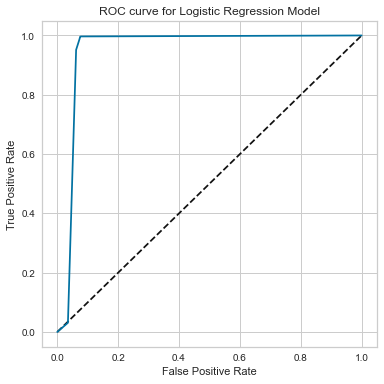

In [100]:
probs = loan_clf.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, probs)

fig = plt.figure(figsize = (6, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for Logistic Regression Model')
plt.show()

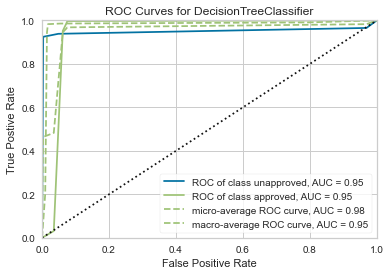

In [134]:
visualizer = ROCAUC(loan_clf, classes=['unapproved', 'approved'])
visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)
visualizer.show();

In [101]:
auc = roc_auc_score(y_test, probs)
print('Area under the ROC curve: {:.3f}'.format(auc))

Area under the ROC curve: 0.950


The particular curve for this classifier is quite good as you can see it steeply climbs before leveling out.

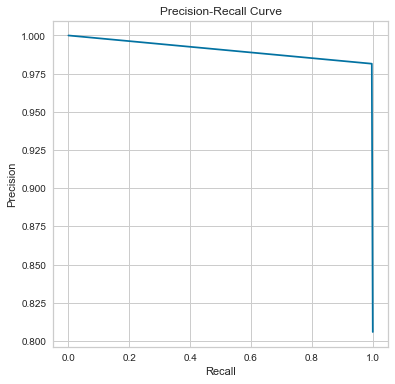

In [102]:
pres, rec, thresholds = precision_recall_curve(y_test, predictions)
fig = plt.figure(figsize = (6, 6))
plt.plot(rec, pres)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

We see here that the precision only suffers slightly at the expense of the recall.

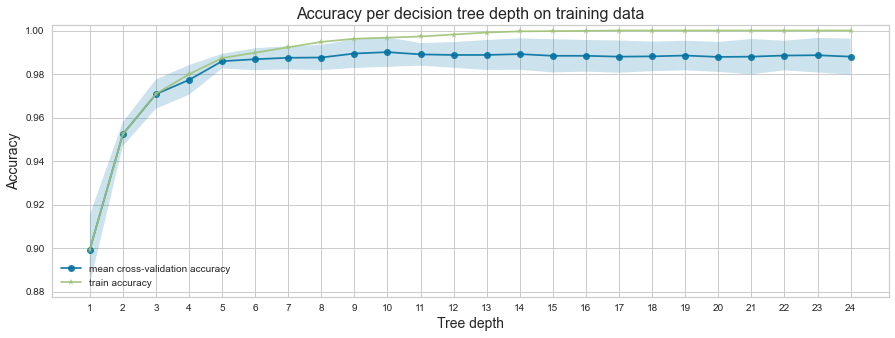

In [103]:
# function for fitting trees of various depths on the training data using cross-validation
def run_cross_validation_on_trees(X, y, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_std = []
    cv_scores_mean = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = DecisionTreeClassifier(max_depth=depth)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores
  
# function for plotting cross-validation results
def plot_cross_validation_on_trees(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean+2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='train accuracy', alpha=0.9)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Tree depth', fontsize=14)
    ax.set_ylabel('Accuracy', fontsize=14)
    ax.set_ylim(ylim)
    ax.set_xticks(depths)
    ax.legend()

# fitting trees of depth 1 to 24
sm_tree_depths = range(1,25)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(X_train, y_train, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')


In [106]:
idx_max = sm_cv_scores_mean.argmax()
sm_best_tree_depth = sm_tree_depths[idx_max]
sm_best_tree_cv_score = sm_cv_scores_mean[idx_max]
sm_best_tree_cv_score_std = sm_cv_scores_std[idx_max]
print('The depth-{} tree achieves the best mean cross-validation accuracy {} +/- {}% on training dataset'.format(
      sm_best_tree_depth, round(sm_best_tree_cv_score*100,5), round(sm_best_tree_cv_score_std*100, 5)))

The depth-10 tree achieves the best mean cross-validation accuracy 99.00804 +/- 0.33905% on training dataset


In [107]:
# function for training and evaluating a tree
def run_single_tree(X_train, y_train, X_test, y_test, depth):
    model = DecisionTreeClassifier(max_depth=depth).fit(X_train, y_train)
    accuracy_train = model.score(X_train, y_train)
    accuracy_test = model.score(X_test, y_test)
    print('Single tree depth: ', depth)
    print('Accuracy, Training Set: ', round(accuracy_train*100,5), '%')
    print('Accuracy, Test Set: ', round(accuracy_test*100,5), '%')
    return accuracy_train, accuracy_test
  

# train and evaluate a 5-depth tree
sm_best_tree_accuracy_train, sm_best_tree_accuracy_test = run_single_tree(X_train, y_train, 
                                                                          X_test, y_test, 
                                                                          sm_best_tree_depth)

Single tree depth:  10
Accuracy, Training Set:  99.67371 %
Accuracy, Test Set:  98.22547 %


## Random Forest Classifier

In [108]:
rfc = ensemble.RandomForestClassifier(random_state=42)
rfc.fit(X_train, y_train)
cross_val_score(rfc, X_train, y_train, cv=10)

array([0.9934811 , 0.99217731, 0.9843342 , 0.98825065, 0.98041775,
       0.98825065, 0.99086162, 0.98825065, 0.98955614, 0.98694517])

In [109]:
X_train.columns

Index(['fico', 'fico_cross_revol', 'inq.last.6mths', 'days.with.cr.line',
       'dti', 'log.annual.inc', 'revol.bal', 'delinq.2yrs', 'pub.rec',
       'not.fully.paid', 'purpose_debt_consolidation', 'purpose_educational',
       'purpose_small_business'],
      dtype='object')

In [110]:
test_score = rfc.score(X_test, y_test)
train_score = rfc.score(X_train, y_train)

print('Score on training data: ', train_score)
print('Score on test data: ', test_score)

Score on training data:  1.0
Score on test data:  0.9812108559498957


In [111]:
print(len(rfc.estimators_))

100


In [112]:
for i in enumerate(features, start=1):
    print(i)

(1, 'fico')
(2, 'fico_cross_revol')
(3, 'inq.last.6mths')
(4, 'days.with.cr.line')
(5, 'dti')
(6, 'log.annual.inc')
(7, 'revol.bal')
(8, 'delinq.2yrs')
(9, 'pub.rec')
(10, 'not.fully.paid')
(11, 'purpose_debt_consolidation')
(12, 'purpose_educational')
(13, 'purpose_small_business')


In [113]:
features_dict = {  
"f1":u"FICO",
"f2":u"FICO * Credit Utilization",
"f3":u"Inquiry in the last six months",
"f4":u"Days with credit line",
"f5":u"Debt-to-income ratio",
"f6":u"Annual Income",
"f7":u"Revolving credit balance",
"f8":u"Delinquencies in the past two years",
"f9":u"Public record",
"f10":u"Balances not fully paid",
"f11":u"Debt Consolidation loan",
"f12":u"Educational Loan",
"f13":u"Small business loan",               
}

### Order of Importance

Feature ranking:
1. Inquiry in the last six months 0.417422 
2. FICO 0.254025 
3. Days with credit line 0.122632 
4. Revolving credit balance 0.076000 
5. Debt-to-income ratio 0.068387 
6. FICO * Credit Utilization 0.023458 
7. Annual Income 0.021693 
8. Balances not fully paid 0.006485 
9. Delinquencies in the past two years 0.004470 
10. Debt Consolidation loan 0.001736 
11. Public record 0.001309 
12. Small business loan 0.001301 
13. Educational Loan 0.001081 


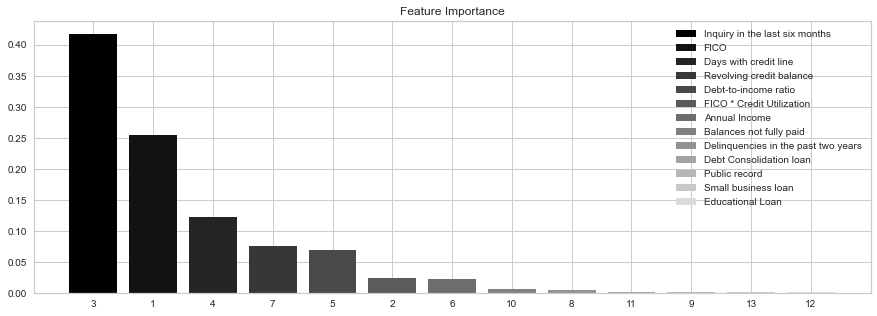

In [114]:
importances = rfc.feature_importances_

indices = np.argsort(importances)[::-1]
# Plot the feature importancies of the forest
num_to_plot = 13
feature_indices = [ind+1 for ind in indices[:num_to_plot]]

# Print the feature ranking
print("Feature ranking:")
  
for f in range(num_to_plot):
    print("%d. %s %f " % (f + 1, 
            features_dict["f"+str(feature_indices[f])], 
            importances[indices[f]]))
plt.figure(figsize=(15,5))
plt.title(u"Feature Importance")
bars = plt.bar(range(num_to_plot), 
               importances[indices[:num_to_plot]],
       color=([str(i/float(num_to_plot+1)) 
               for i in range(num_to_plot)]),
               align="center")
ticks = plt.xticks(range(num_to_plot), 
                   feature_indices)
plt.xlim([-1, num_to_plot])
plt.legend(bars, [u''.join(features_dict["f"+str(i)]) 
                  for i in feature_indices]);

After the five most important features, we start to see the importance drop off below 3%. To select features for computationally expensive models, we may only want to limit the features (max_features) to five. 

In [1167]:
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=3000)

for index in range(0, 5):
    tree.plot_tree(rfc.estimators_[index],
                   feature_names = features,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

In [115]:
predictions = rfc.predict(X_test)

confusion = confusion_matrix(y_test, predictions, labels=[0, 1])
print(confusion)

[[ 341   31]
 [   5 1539]]


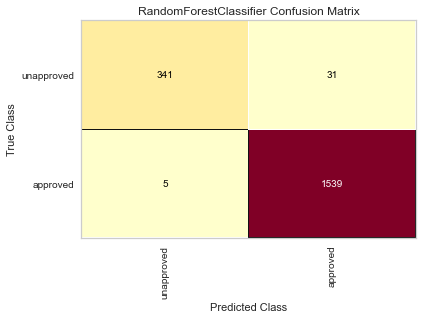

In [141]:
cm = ConfusionMatrix(rfc, classes=['unapproved', 'approved'])
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

This model performs only very slightly better than the decision tree when it comes to true positives, and worse for negatives.

In [145]:
report = classification_report(y_test, predictions, target_names =['unapproved', 'approved'], labels = [0, 1], output_dict=True)
report_df = pd.DataFrame(report).transpose().round(2)
report_df

,precision,recall,f1-score,support
unapproved,0.99,0.92,0.95,372.0
approved,0.98,1.0,0.99,"1,544.0"
accuracy,0.98,0.98,0.98,0.98
macro avg,0.98,0.96,0.97,"1,916.0"
weighted avg,0.98,0.98,0.98,"1,916.0"


In [146]:
report_df.to_excel(r'/Users/dean/desktop/randomforest.xlsx')

In [120]:
precision = precision_score(y_test, predictions)
print('Precision score: {:.2f}'.format(precision))

Precision score: 0.98


In [121]:
recall = recall_score(y_test, predictions)
print('Recall score: {:.2f}'.format(recall))

Recall score: 1.00


In [122]:
f1 = f1_score(y_test, predictions)
fbeta_precision = fbeta_score(y_test, predictions, 0.5)
fbeta_recall = fbeta_score(y_test, predictions, 2)

print('F1 score: {:.2f}'.format(f1))
print('Fbeta score favoring precision: {:.2f}'.format(fbeta_precision))
print('FBeta score favoring recall: {:.2f}'.format(fbeta_recall))

F1 score: 0.99
Fbeta score favoring precision: 0.98
FBeta score favoring recall: 0.99


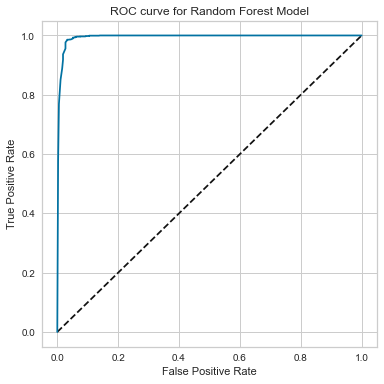

In [148]:
probs = rfc.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, probs)

fig = plt.figure(figsize = (6, 6))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve for Random Forest Model')
plt.show()

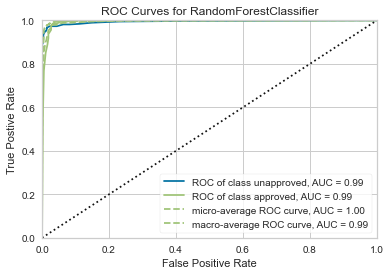

In [149]:
visualizer = ROCAUC(rfc, classes=['unapproved', 'approved'])
visualizer.fit(X_train, y_train) 
visualizer.score(X_test, y_test)
visualizer.show();

In [124]:
auc = roc_auc_score(y_test, probs)
print('Area under the ROC curve: {:.3f}'.format(auc))

Area under the ROC curve: 0.950


The particular curve for this classifier is quite good as you can see it steeply climbs before leveling out.

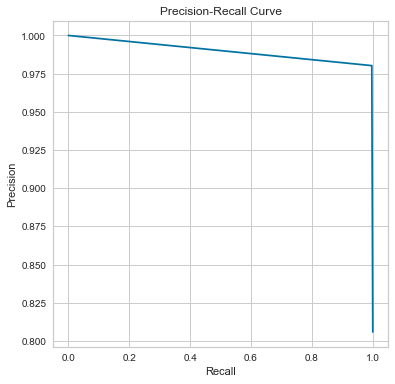

In [125]:
pres, rec, thresholds = precision_recall_curve(y_test, predictions)
fig = plt.figure(figsize = (6, 6))
plt.plot(rec, pres)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

As the precision and the recall are both 100%, there is no tradeoff for either as either increases.

In [126]:
for params, v in rfc.get_params().items():
    print({params: v})

{'bootstrap': True}
{'ccp_alpha': 0.0}
{'class_weight': None}
{'criterion': 'gini'}
{'max_depth': None}
{'max_features': 'auto'}
{'max_leaf_nodes': None}
{'max_samples': None}
{'min_impurity_decrease': 0.0}
{'min_impurity_split': None}
{'min_samples_leaf': 1}
{'min_samples_split': 2}
{'min_weight_fraction_leaf': 0.0}
{'n_estimators': 100}
{'n_jobs': None}
{'oob_score': False}
{'random_state': 42}
{'verbose': 0}
{'warm_start': False}


In [127]:
rfc = ensemble.RandomForestClassifier(random_state=42)
grid_values = {'criterion': ['gini', 'entropy'],
              'max_leaf_nodes': [5, 50, 500, 5000],
              'max_features': ['auto', 'sqrt', 'log2'],
              'n_estimators': [10, 100, 500]}
grid_rfc_acc = GridSearchCV(rfc, param_grid = grid_values)
grid_rfc_acc.fit(X_train, y_train)

#Predict values based on new parameters
y_pred_acc = grid_rfc_acc.predict(X_test)

# New Model Evaluation metrics

print('Accuracy Score : ' + str(accuracy_score(y_test,y_pred_acc)))
print('Precision Score : ' + str(precision_score(y_test,y_pred_acc)))
print('Recall Score : ' + str(recall_score(y_test,y_pred_acc)))
print('F1 Score : ' + str(f1_score(y_test,y_pred_acc)))

#Logistic Regression (Grid Search) Confusion matrix
confusion = confusion_matrix(y_test,y_pred_acc)

Accuracy Score : 0.9817327766179541
Precision Score : 0.9808795411089866
Recall Score : 0.9967616580310881
F1 Score : 0.9887568262126566


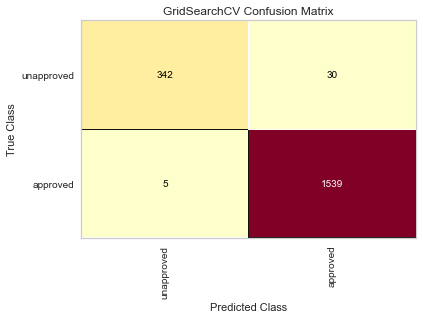

In [142]:
cm = ConfusionMatrix(grid_rfc_acc, classes=['unapproved', 'approved'])
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show();

In [130]:
for param, v in grid_rfc_acc.best_params_.items():
    print({param: v})
    
print(grid_rfc_acc.best_score_)

{'criterion': 'entropy'}
{'max_features': 'auto'}
{'max_leaf_nodes': 500}
{'n_estimators': 500}
0.9886450227288599


In [150]:
report = classification_report(y_test, y_pred_acc, target_names =['unapproved', 'approved'], labels = [0, 1], output_dict=True)
report_df = pd.DataFrame(report).transpose().round(2)
report_df

,precision,recall,f1-score,support
unapproved,0.99,0.92,0.95,372.0
approved,0.98,1.0,0.99,"1,544.0"
accuracy,0.98,0.98,0.98,0.98
macro avg,0.98,0.96,0.97,"1,916.0"
weighted avg,0.98,0.98,0.98,"1,916.0"


In [151]:
report_df.to_excel(r'/Users/dean/desktop/randomforest-gridsearch.xlsx')

## Conclusion

My conclusion would be to use the decision tree classifier. I would choose this over the Random Forest because it is less of a black box, and may be easier to explain to potential investors. There are illustrations that can be created to show what the model is looking at and categorizing. 

# Regression Models

## Dummy (Baseline) Regression - Interest Rates

I decided not to include these in my presentation. The scores were not near an accuracy that I felt comfortable with (less than 60%). My conclusion was there must be a significant amount of discretion that the bank uses in setting the rates. I left the information commented out, in case I want to revisit this model.

In [1000]:
# df.shape

In [1001]:
# list(enumerate(df.columns))

In [1002]:
# y = raw_df['int.rate']

In [1003]:
# approved_df = df[df['credit.policy'] == 1]
# unapproved_df = df[df['credit.policy'] == 0]

In [1004]:
# y_approved = approved_df['int.rate']
# y_unapproved = unapproved_df['int.rate']

In [1007]:
# features = ['credit.policy',
#             'fico',
#             'inq.last.6mths',
#             'days.with.cr.line',
#             'dti',
#             'log.annual.inc',
#             'revol.bal',
#             'revol.util',
#             'delinq.2yrs',
#             'pub.rec',
#             'not.fully.paid',
#             'purpose_debt_consolidation',
#             'purpose_educational',
#             'purpose_small_business']

In [1008]:
# X = df[features]

In [1009]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# print("The number of observations in training set is {}".format(X_train.shape[0]))
# print("The number of observations in test set is {}".format(X_test.shape[0]))

In [1010]:
# X_approved = approved_df[features]
# X_unapproved = unapproved_df[features]

# print(X_approved.shape)
# print(X_unapproved.shape)

In [1011]:
# X_train_app, X_test_app, y_train_app, y_test_app = train_test_split(X_approved, y_approved, test_size = 0.2, random_state = 42)

# print("The number of approved observations in training set is {}".format(X_train_app.shape[0]))
# print("The number of approved observations in test set is {}".format(X_test_app.shape[0]))

In [1012]:
# from sklearn.dummy import DummyRegressor
# dr = DummyRegressor(strategy='median')
# dr.fit(X_train, y_train)
# y_pred = dr.predict(X_test)
# y_pred_train = dr.predict(X_train)

In [1013]:
# print('Mean absolute error : ' + str(mean_absolute_error(y_test, y_pred)))
# print('R^2 score on training data : ' + str(r2_score(y_train, y_pred_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, y_pred)))

In [1014]:
# y_pred[:10]

In [1015]:
# y_test.describe()

With the dummy model, we see that the value predicted is repeatedly the mean interest rate. This won't help us with building a model--take a look at the graph and how far away the mean values are from the actual values. The interest rates fluctuate from 6% to 20.2%--we will need a model that can capture those values.

In [1016]:
# print("Making predictions for interest rate using Dummy Regression:")
# twenty_pred = dtr.predict(X_test)
# twenty_actual = y_test

# plt.figure(figsize=(15, 10))
# plt.scatter(y_pred, y_test, c='green')
# plt.plot(np.sort(y_test, axis=0),np.sort(y_test, axis=0), label="ideal")
# plt.title("Dummy model: true and predicted interest rates")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.legend()
# plt.show()

## Linear Regression

In [1017]:
# X_train = sm.add_constant(X_train)

In [1018]:
# lrm = linear_model.LinearRegression()

# # fit method estimates the coefficients using OLS
# lrm.fit(X_train, y_train)

# # We fit an OLS model using statsmodels
# results = sm.OLS(y_train, X_train).fit()

# # We print the summary results
# print(results.summary())

# # Inspect the results.
# print('\nCoefficients: \n', lrm.coef_)
# print('\nIntercept: \n', lrm.intercept_)

With the linear regression model, we see the line where the actual and predicted values should line up exactly. They are scattered around this line; but some are far above and below the line. We see one value predicted at 14% interest while the actual value was 6%. Another was predicted at 11% interest while the actual value was 19%. We will come back to this graph to show the relationships with other models and discuss ways to raise the score.

In [1019]:
# print("Making predictions for interest rates using Linear Regression:")
# X_test = sm.add_constant(X_test)

# # We are making predictions here
# y_preds = results.predict(X_test)

# plt.figure(figsize=(15, 10))
# plt.scatter(y_test, y_preds)
# plt.plot(np.sort(y_test, axis=0),np.sort(y_test, axis=0), color='red', label="ideal")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.title("Linear Regression: true and predicted interest rates")
# plt.legend()
# plt.show()

## Decision Tree Regression

In [1020]:
# X_test.drop(columns='const', inplace=True)
# X_train.drop(columns='const', inplace=True)

Here we will try to find the ideal depth. We want something that is on the lower end for accuracy, since a high max_depth will lead to overfitting.

In [1021]:
# # function for training and evaluating a tree
# def run_single_tree(X_train, y_train, X_test, y_test, depth):
#     model = DecisionTreeRegressor(max_depth=depth).fit(X_train, y_train)
#     accuracy_train = model.score(X_train, y_train)
#     accuracy_test = model.score(X_test, y_test)
#     print('Single tree depth: ', depth)
#     print('Accuracy, Training Set: ', round(accuracy_train*100,5), '%')
#     print('Accuracy, Test Set: ', round(accuracy_test*100,5), '%')
#     return accuracy_train, accuracy_test
  

# # train and evaluate a 5-depth tree
# sm_best_tree_accuracy_train, sm_best_tree_accuracy_test = run_single_tree(X_train, y_train, 
#                                                                           X_test, y_test, 
#                                                                           sm_best_tree_depth)

In [1022]:
# idx_max = sm_cv_scores_mean.argmax()
# sm_best_tree_depth = sm_tree_depths[idx_max]
# sm_best_tree_cv_score = sm_cv_scores_mean[idx_max]
# sm_best_tree_cv_score_std = sm_cv_scores_std[idx_max]
# print('The depth-{} tree achieves the best mean cross-validation accuracy {} +/- {}% on training dataset'.format(
#       sm_best_tree_depth, round(sm_best_tree_cv_score*100,5), round(sm_best_tree_cv_score_std*100, 5)))

In [1023]:
# # Define model. Specify a number for random_state to ensure same results each run
# dtr = DecisionTreeRegressor(random_state=42, max_depth=10)

# # Fit model
# dtr.fit(X_train, y_train)
# y_pred = dtr.predict(X_test)
# y_pred_train = dtr.predict(X_train)

In [1024]:
# mae = mean_absolute_error(y_test, pred_y)
# mse = mean_squared_error(y_test, pred_y)
# r2 = r2_score(y_test, pred_y)
# errors = abs(pred_y - y_test)
# mape = 100 * np.mean(base_errors / y_test)
# accuracy = 100 - base_mape

# print(' - Model Performance - ')
# print('\nMean Absolute Error: {:0.4f}.'.format(mae))
# print('Mean Squared Error: {:0.4f}.'.format(mse))
# print('R^2 Score = {:0.4f}.'.format(r2))
# print('Accuracy = {:0.2f}%.'.format(accuracy))

In [1059]:
# print('R^2 score on training data : ' + str(r2_score(y_train, y_pred_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, y_pred)))

The decision tree regressor is overfit to the training data and cannot perform on the test data.

Below is a visual representation of the decision tree, simplified to just three nodes. The regressor splits the tranining data up, first with FICO under or over the mean. 

The remaining data gets split further by debt-to-income ratio, whether it's a small business, and the revolving credit utilization. 

From here it puts the interest rate into eight interest rate buckets. It works as a classifier in the end, but the outputs can be plotted on a graph to show a continuous relationship.

### Decision Tree Visulaization

In [1033]:
# # Define model. Specify a number for random_state to ensure same results each run
# dtr2 = DecisionTreeRegressor(max_depth=3, random_state=42)

# # Fit model
# dtr2.fit(X_train, y_train)

In [1034]:
# viz = dtreeviz(dtr2, X_train, y_train,
#                 target_name="int.rate",
#                 feature_names=X.columns,
#               scale=1.5)

# viz

This model has a discrepancy between the test data and the training data, which means it is overfit to the noise of the training set. What we want is for a model to be used for new data, so it will need to adapt to the test data set and any other future datasets. We will try to shorten this gap with fine-tuning the parameters later on.

In [1032]:
# print("Making predictions for interest rates using Decision Tree on testing data:")
# y_pred = dtr.predict(X_test)
# y_actual = y_test

# plt.figure(figsize=(15, 10))
# plt.scatter(y_pred, y_actual, c='coral')
# plt.plot(np.sort(y_test, axis=0),np.sort(y_test, axis=0), label="ideal")
# plt.title("Decision Tree: true and predicted interest test rates")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.legend()
# plt.show()

In [1031]:
# print("Making predictions for interest rates using Decision Tree training data:")
# y_pred = dtr.predict(X_train)
# y_actual = y_train

# plt.figure(figsize=(15, 10))
# plt.scatter(y_pred, y_actual, c='coral')
# plt.plot(np.sort(y_train, axis=0),np.sort(y_train, axis=0), label="ideal")
# plt.title("Decision Tree: true and predicted interest training rates")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.legend()
# plt.show()

The scoring is not so impressive on the decision tree regressor. Let's try breaking it up into approved and unapproved loans to see if the accuracy improves:

### Unapproved vs. Approved Models

In [1030]:
# dtr_unapp = DecisionTreeRegressor(random_state=42)

# # Fit model
# dtr_unapp.fit(X_train_unapp, y_train_unapp)

# pred_y_unapp_train = dtr_app.predict(X_train_unapp)
# pred_y_unapp = dtr_app.predict(X_test_unapp)
# print('Mean absolute error : ' + str(mean_absolute_error(y_test_unapp, pred_y_unapp)))

In [1029]:
# print('R^2 score on training data : ' + str(r2_score(y_train_unapp, pred_y_unapp_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test_unapp, pred_y_unapp)))

The R^2 score on the unapproved loans is negative--which means this model is unusable.

In [1028]:
# dtr_app = DecisionTreeRegressor(random_state=42, max_depth=10)

# # Fit model
# dtr_app.fit(X_train_app, y_train_app)

# pred_y_app_train = dtr_app.predict(X_train_app)
# pred_y_app = dtr_app.predict(X_test_app)
# print('Mean absolute error : ' + str(mean_absolute_error(y_test_app, pred_y_app)))

In [1027]:
# mae = mean_absolute_error(y_test_app, pred_y_app)
# mse = mean_squared_error(y_test_app, pred_y_app)
# r2 = r2_score(y_test_app, pred_y_app)
# errors = abs(pred_y_app - y_test_app)
# mape = 100 * np.mean(base_errors / y_test_app)
# accuracy = 100 - base_mape

# print('Model Performance:')
# print('\nMean Absolute Error: {:0.4f}.'.format(mae))
# print('Mean Squared Error: {:0.4f}.'.format(mse))
# print('R^2 Score = {:0.4f}.'.format(r2))
# print('Accuracy = {:0.2f}%.'.format(accuracy))

In [1026]:
# print('R^2 score on training data : ' + str(r2_score(y_train_app, pred_y_app_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test_app, pred_y_app)))

The R^2 score on the approved loans is slightly better than the R^2 score on loans overall. We could use this to determine the interest rates for the applicants that meet the criteria.

However, the model is still overfit to the training data.

We see in the regression plot that unapproved loans has more sparsity around its regression than the approved loans. Keep in mind that 85% of loans were approved in this dataset, so it could be a result of using less data.

In [1025]:
# # regression plot using seaborn
# fig = plt.figure(figsize=(15, 10))
# cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
# sns.regplot(x=pred_y_unapp, y=y_test_unapp, color='blue', marker='+')
# sns.regplot(x=pred_y_app, y=y_test_app, color='green', marker='o')

# # Legend, title and labels.
# plt.legend(labels=['Unapproved', 'Approved'])
# plt.title('Relationship between Predicted and Actual Interest', size=24)
# plt.xlabel('true values', size=12)
# plt.ylabel('predicted values', size=12);

We can conclude that there is more uncertainty around the unapproved loans.

In [1035]:
# for params, v in dtr.get_params().items():
#     print({params: v})

### Decision Tree Tuning

Here we will look for the best parameters to see if we can improve the accuracy:

In [1036]:
# dtr = DecisionTreeRegressor(max_depth=7)
# grid_values = {'criterion': ['mse'],
#                 'min_weight_fraction_leaf': [0, 0.1, 0.2, 0.3],
#                 'min_samples_leaf': [1, 2, 3, 4, 5, 6],
#                 'min_samples_split': [2, 3, 4, 5, 6]}
# grid_dtr_acc = GridSearchCV(dtr, param_grid = grid_values)
# grid_dtr_acc.fit(X_train, y_train)

# # try scoring='recall' or 'accuracy'
# #Predict values based on new parameters
# y_pred_acc = grid_dtr_acc.predict(X_test)
# y_pred_acc_train = grid_dtr_acc.predict(X_train)

In [1037]:
# grid_dtr_acc.best_params_

In [1038]:
# print('R^2 score on training data : ' + str(r2_score(y_train, y_pred_acc_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, y_pred_acc)))

## Random Forest Regression

In [1039]:
# rfr = RandomForestRegressor(random_state=42)

# rfr.fit(X_train, y_train)

In [1040]:
# print("Making predictions for the first 10 loans:")
# print(rfr.predict(X_train.head(10)))

In [1041]:
# preds_train = rfr.predict(X_train)
# preds = rfr.predict(X_test)
# print('Mean absolute error : ' + str(mean_absolute_error(y_test, preds)))

In [1042]:
# print('R^2 score on training data : ' + str(r2_score(y_train, preds_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, preds)))

In [1043]:
# mae = mean_absolute_error(y_test, preds)
# mse = mean_squared_error(y_test, preds)
# r2 = r2_score(y_test, preds)
# errors = abs(preds - y_test)
# mape = 100 * np.mean(base_errors / y_test)
# accuracy = 100 - base_mape

# print('Model Performance:')
# print('\nMean Absolute Error: {:0.4f}.'.format(mae))
# print('Mean Squared Error: {:0.4f}.'.format(mse))
# print('R^2 Score = {:0.4f}.'.format(r2))
# print('Accuracy = {:0.2f}%.'.format(accuracy))

We can see that the R^2 score is higher on the training data than the test data for the random forest regressor. The discrepancy is not quite as large, however, as the Decision Tree model. A score of 63% is acceptable on testing data--we may work to boost this score with some other methods below.

In [1044]:
# print("Making predictions for interest rates using Random Forest on testing data:")
# y_pred = rfr.predict(X_test)
# y_actual = y_test

# plt.figure(figsize=(15, 10))
# plt.scatter(y_pred, y_actual, c='violet')
# plt.plot(np.sort(y_test, axis=0),np.sort(y_test, axis=0), label="ideal")
# plt.title("Random Forest: true and predicted interest test rates")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.legend()
# plt.show()

In [1045]:
# print("Making predictions for interest rates using Random Forest on training data:")
# y_pred = rfr.predict(X_train)
# y_actual = y_train

# plt.figure(figsize=(15, 10))
# plt.scatter(y_pred, y_actual, c='violet')
# plt.plot(np.sort(y_test, axis=0),np.sort(y_test, axis=0), label="ideal")
# plt.title("Random Forest: true and predicted interest test rates")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.legend()
# plt.show()

In [1046]:
# list(rfr.get_params().items())

In [1047]:
# rfr = RandomForestRegressor()
# grid_values = {'criterion': ['friedman_mse', 'mse'],
#                'bootstrap': [True, False],
#                'max_depth': [7, 8, 9, 10],
#                 'n_estimators': [100, 200, 300]}
# grid_rfr_acc = GridSearchCV(rfr, param_grid = grid_values)
# grid_rfr_acc.fit(X_train, y_train)

# # try scoring='recall' or 'accuracy'
# #Predict values based on new parameters
# y_pred_acc = grid_rfr_acc.predict(X_test)
# y_pred_acc_train = grid_rfr_acc.predict(X_train)

In [1048]:
# grid_rfr_acc.best_params_

In [1049]:
# print('R^2 score on training data : ' + str(r2_score(y_train, y_pred_acc_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, y_pred_acc)))

## Gradient Boosting Regression

In [1050]:
# # Initialize and fit the model.
# gbr = ensemble.GradientBoostingRegressor()
# gbr.fit(X_train, y_train)

# predict_train = gbr.predict(X_train)
# predict_test = gbr.predict(X_test)

In [1051]:
# print('R^2 score on training data : ' + str(r2_score(y_train, predict_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, predict_test)))

In [1052]:
# mae = mean_absolute_error(y_test, predict_test)
# mse = mean_squared_error(y_test, predict_test)
# r2 = r2_score(y_test, predict_test)
# errors = abs(predict_test - y_test)
# mape = 100 * np.mean(base_errors / y_test)
# accuracy = 100 - base_mape

# print('Model Performance:')
# print('\nMean Absolute Error: {:0.4f}.'.format(mae))
# print('Mean Squared Error: {:0.4f}.'.format(mse))
# print('R^2 Score = {:0.4f}.'.format(r2))
# print('Accuracy = {:0.2f}%.'.format(accuracy))

In [1053]:
# list(gbr.get_params().items())

In [1054]:
# print("Making predictions for interest rates using Random Forest on testing data:")
# y_pred = gbr.predict(X_test)
# y_actual = y_test

# plt.figure(figsize=(15, 10))
# plt.scatter(y_pred, y_actual, c='turquoise')
# plt.plot(np.sort(y_test, axis=0),np.sort(y_test, axis=0), label="ideal")
# plt.title("Gradient Boosting: true and predicted interest test rates")
# plt.xlabel("true values")
# plt.ylabel("predicted values")
# plt.legend()
# plt.show()

### Gradient Boosting Tuning

In [1055]:
# gbr = ensemble.GradientBoostingRegressor()
# grid_values = {'criterion': ['friedman_mse'],
#                'learning_rate': [0.1],
#                 'n_estimators': [200, 300]}
# grid_gbr_acc = GridSearchCV(gbr, param_grid = grid_values)
# grid_gbr_acc.fit(X_train, y_train)

# # try scoring='recall' or 'accuracy'
# #Predict values based on new parameters
# y_pred_acc = grid_gbr_acc.predict(X_test)
# y_pred_acc_train = grid_gbr_acc.predict(X_train)

In [1056]:
# grid_gbr_acc.best_params_.items()

In [1057]:
# mae = mean_absolute_error(y_test, y_pred_acc)
# mse = mean_squared_error(y_test, y_pred_acc)
# r2 = r2_score(y_test, y_pred_acc)
# errors = abs(y_pred_acc - y_test)
# mape = 100 * np.mean(base_errors / y_test)
# accuracy = 100 - base_mape

# print('Model Performance:')
# print('\nMean Absolute Error: {:0.4f}.'.format(mae))
# print('Mean Squared Error: {:0.4f}.'.format(mse))
# print('R^2 Score = {:0.4f}.'.format(r2))
# print('Accuracy = {:0.2f}%.'.format(accuracy))

In [1058]:
# print('R^2 score on training data : ' + str(r2_score(y_train, y_pred_acc_train)))
# print('R^2 score on testing data : ' + str(r2_score(y_test, y_pred_acc)))